In [1]:
import requests
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.chrome.options import Options

options = Options()
options.headless = True
options.add_argument("--disable-gpu")
options.add_argument("--disable-extensions")
options.add_argument("--disable-dev-shm-usage")
options.add_argument("--no-sandbox")
options.add_argument("--blink-settings=imagesEnabled=false")


In [2]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


In [3]:
import os
from dotenv import load_dotenv
import mysql.connector
from sqlalchemy import create_engine
import pyodbc

load_dotenv()

chromedriver_path = os.getenv('CHROMEDRIVER_PATH')
service = Service(chromedriver_path)

config = {
    'user': os.getenv('MYSQL_USER'),
    'password': os.getenv('MYSQL_PASSWORD'),
    'host': 'localhost',
    'raise_on_warnings': True
}


In [4]:
import traceback
import pandas as pd
import matplotlib.pyplot as plt
import time
import seaborn as sns
import numpy as np
import copy
from scipy.stats import skew
pd.set_option('display.max_columns', None)


In [5]:
url = "https://www.nba.com/stats/teams/boxscores-advanced"

driver = webdriver.Chrome(service=service,options=options)
driver.get(url)

try:
    try:
        cookie_button = WebDriverWait(driver, 10).until(
            EC.element_to_be_clickable((By.ID, "onetrust-accept-btn-handler"))
        )
        cookie_button.click()
    except Exception:
        pass
    
    dropdowns = WebDriverWait(driver, 10).until(
        EC.presence_of_all_elements_located((By.CLASS_NAME, "DropDown_select__4pIg9"))
    )

    first_dropdown = dropdowns[0]
    first_dropdown.click()
    time.sleep(1)

    options_first = first_dropdown.find_elements(By.TAG_NAME, "option")
    second_option = options_first[1]
    second_option.click()

    time.sleep(1)

    dropdown = WebDriverWait(driver, 10).until(
        EC.presence_of_all_elements_located((By.CLASS_NAME, "DropDown_select__4pIg9"))
    )[11]
    dropdown.click()

    time.sleep(1)

    options = dropdown.find_elements(By.TAG_NAME, "option")
    all_option = options[0]
    all_option.click()

    time.sleep(2)
    
    block = WebDriverWait(driver, 10).until(
        EC.presence_of_element_located((By.CLASS_NAME, "Crom_base__f0niE"))
    )

    children = block.find_elements(By.XPATH, './*')
    
    if len(children) >= 3:
        extra_game_table = children[2]
        extra_game_table_text = extra_game_table.text
        print(f"Third component: {extra_game_table.tag_name} - {extra_game_table.text}")
    else:
        print("There are fewer than 3 child components.")

except Exception as e:
    print(f"Error during execution: {e}")

finally:
    time.sleep(5)
    driver.quit()


Error during execution: Message: no such window: target window already closed
from unknown error: web view not found
  (Session info: chrome=131.0.6778.109)
Stacktrace:
	GetHandleVerifier [0x00007FF68BF26CB5+28821]
	(No symbol) [0x00007FF68BE93840]
	(No symbol) [0x00007FF68BD3578A]
	(No symbol) [0x00007FF68BD0F4F5]
	(No symbol) [0x00007FF68BDB6247]
	(No symbol) [0x00007FF68BDCECE2]
	(No symbol) [0x00007FF68BDAF0A3]
	(No symbol) [0x00007FF68BD7A778]
	(No symbol) [0x00007FF68BD7B8E1]
	GetHandleVerifier [0x00007FF68C25FCAD+3408013]
	GetHandleVerifier [0x00007FF68C27741F+3504127]
	GetHandleVerifier [0x00007FF68C26B5FD+3455453]
	GetHandleVerifier [0x00007FF68BFEBDBB+835995]
	(No symbol) [0x00007FF68BE9EB5F]
	(No symbol) [0x00007FF68BE9A814]
	(No symbol) [0x00007FF68BE9A9AD]
	(No symbol) [0x00007FF68BE8A199]
	BaseThreadInitThunk [0x00007FFD963B259D+29]
	RtlUserThreadStart [0x00007FFD978CAF38+40]



KeyboardInterrupt: 

In [18]:
url = "https://www.nba.com/stats/teams/boxscores-traditional"

driver = webdriver.Chrome(service=service)
driver.get(url)

try:
    try:
        cookie_button = WebDriverWait(driver, 10).until(
            EC.element_to_be_clickable((By.ID, "onetrust-accept-btn-handler"))
        )
        cookie_button.click()
    except Exception:
        pass

    dropdowns = WebDriverWait(driver, 10).until(
        EC.presence_of_all_elements_located((By.CLASS_NAME, "DropDown_select__4pIg9"))
    )

    first_dropdown = dropdowns[0]
    first_dropdown.click()
    time.sleep(1)

    options_first = first_dropdown.find_elements(By.TAG_NAME, "option")
    second_option = options_first[1]
    second_option.click()

    time.sleep(1)

    dropdown = WebDriverWait(driver, 10).until(
        EC.presence_of_all_elements_located((By.CLASS_NAME, "DropDown_select__4pIg9"))
    )[11]
    dropdown.click()

    time.sleep(1)

    options = dropdown.find_elements(By.TAG_NAME, "option")
    all_option = options[0]
    all_option.click()

    time.sleep(2)

    block = WebDriverWait(driver, 10).until(
        EC.presence_of_element_located((By.CLASS_NAME, "Crom_base__f0niE"))
    )

    children = block.find_elements(By.XPATH, './*')

    if len(children) >= 3:
        game_table = children[2]
        game_table_text = game_table.text
        print(f"Third component: {game_table.tag_name} - {game_table.text}")
    else:
        print("There are fewer than 3 child components.")

except Exception as e:
    print(f"Error during execution: {e}")
    time.sleep(5)  
    driver.quit()

finally:
    time.sleep(5)
    driver.quit()


Third component: div - TEAM MATCH UP GAME DATE W/L MIN PTS FGM FGA FG% 3PM 3PA 3P% FTM FTA FT% OREB DREB REB AST TOV STL BLK PF +/-
MIL MIL @ ORL 04/14/2024 L 48 88 30 75 40.0 7 27 25.9 21 23 91.3 7 27 34 16 17 10 4 18 -25
CHI CHI @ NYK 04/14/2024 L 53 119 49 101 48.5 8 31 25.8 13 16 81.3 15 29 44 25 12 15 3 21 -1
MIN MIN vs. PHX 04/14/2024 L 48 106 36 70 51.4 9 26 34.6 25 31 80.6 12 24 36 22 24 7 5 20 -19
CHA CHA @ CLE 04/14/2024 W 48 120 46 91 50.5 19 40 47.5 9 11 81.8 10 37 47 36 10 10 9 11 10
TOR TOR @ MIA 04/14/2024 L 48 103 38 90 42.2 9 34 26.5 18 21 85.7 13 28 41 23 19 6 3 21 -15
BOS BOS vs. WAS 04/14/2024 W 48 132 51 89 57.3 16 32 50.0 14 21 66.7 10 38 48 29 17 10 15 13 10
NYK NYK vs. CHI 04/14/2024 W 53 120 46 91 50.5 12 32 37.5 16 21 76.2 16 37 53 27 21 7 6 17 1
BKN BKN @ PHI 04/14/2024 L 48 86 32 83 38.6 9 34 26.5 13 17 76.5 4 38 42 19 13 8 6 14 -21
POR POR @ SAC 04/14/2024 L 48 82 31 98 31.6 7 45 15.6 13 17 76.5 23 31 54 18 18 11 2 19 -39
SAS SAS vs. DET 04/14/2024 W 48 123

In [61]:
urls = [
    "https://www.nba.com/stats/players/boxscores-traditional",
    "https://www.nba.com/stats/players/boxscores-advanced",
    "https://www.nba.com/stats/players/boxscores-misc",
    "https://www.nba.com/stats/players/boxscores-usage",
    "https://www.nba.com/stats/players/boxscores-scoring",
]

extracted_text_list = []

for url in urls:
    print(f"Starting processing for URL: {url}")
    driver = webdriver.Chrome()
    driver.get(url)

    try:
        try:
            print("Attempting to handle cookie popup...")
            cookie_button = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "onetrust-accept-btn-handler"))
            )
            cookie_button.click()
            print("Cookie popup handled.")
        except Exception as e:
            print("No cookie popup to handle or error occurred:", e)

        try:
            print("Attempting to locate dropdowns...")
            dropdowns = WebDriverWait(driver, 10).until(
                EC.presence_of_all_elements_located((By.CLASS_NAME, "DropDown_select__4pIg9"))
            )
            print(f"Dropdowns found: {len(dropdowns)}")
        except Exception as e:
            print("Error locating dropdowns:", e)
            raise

        first_dropdown = dropdowns[0]
        first_dropdown.click()
        print("First dropdown clicked.")
        time.sleep(1)

        options_first = first_dropdown.find_elements(By.TAG_NAME, "option")
        print(f"Options in first dropdown: {len(options_first)}")
        second_option = options_first[1]
        second_option.click()
        print("Second option in first dropdown clicked.")
        time.sleep(1)

        try:
            print("Checking for popup presence...")
            WebDriverWait(driver, 20).until(EC.presence_of_element_located((By.CLASS_NAME, "bx-close-xsvg")))
            popup_close_button = WebDriverWait(driver, 20).until(
                EC.element_to_be_clickable((By.CLASS_NAME, "bx-close-xsvg"))
            )
            popup_close_button.click()
            print("Popup closed.")
        except Exception as e:
            print("No popup to close or error occurred:", e)

        current_url_texts = []

        for i in range(528):
            print(f"Processing page {i+1} for URL {url}...")

            try:
                block = WebDriverWait(driver, 10).until(
                    EC.presence_of_element_located((By.CLASS_NAME, "Crom_base__f0niE"))
                )
                children = block.find_elements(By.XPATH, './*')
                print(f"Children in block: {len(children)}")

                if len(children) >= 3:
                    player_table = children[2]
                    player_table_text = player_table.text
                    current_url_texts.append(player_table_text)
                    print(f"Page {i+1} text extracted.")

                next_button = WebDriverWait(driver, 10).until(
                    EC.element_to_be_clickable((By.XPATH, '//*[@id="__next"]/div[2]/div[2]/div[3]/section[2]/div/div[2]/div[2]/div[1]/div[5]/button[2]'))
                )
                driver.execute_script("arguments[0].click();", next_button)
                print(f"Clicked next button for page {i+1}.")
                time.sleep(2)

            except Exception as e:
                print(f"Error on page {i+1} for URL {url}: {e}")
                print(traceback.format_exc())
                break

        extracted_text_list.append(current_url_texts)
        print(f"Finished processing for URL: {url}")

    except Exception as e:
        print(f"Error during execution for {url}: {e}")
        print(traceback.format_exc())

    finally:
        time.sleep(5)
        driver.quit()

print("Extracted text list:")
for i, url_texts in enumerate(extracted_text_list, 1):
    print(f"Texts from URL {i}:")
    for text in url_texts:
        print(f"{text}\n")

Starting processing for URL: https://www.nba.com/stats/players/boxscores-traditional
Attempting to handle cookie popup...
Cookie popup handled.
Attempting to locate dropdowns...
Dropdowns found: 12
First dropdown clicked.
Options in first dropdown: 29
Second option in first dropdown clicked.
Checking for popup presence...
Popup closed.
Processing page 1 for URL https://www.nba.com/stats/players/boxscores-traditional...
Children in block: 3
Page 1 text extracted.
Clicked next button for page 1.
Processing page 2 for URL https://www.nba.com/stats/players/boxscores-traditional...
Children in block: 3
Page 2 text extracted.
Clicked next button for page 2.
Processing page 3 for URL https://www.nba.com/stats/players/boxscores-traditional...
Children in block: 3
Page 3 text extracted.
Clicked next button for page 3.
Processing page 4 for URL https://www.nba.com/stats/players/boxscores-traditional...
Children in block: 3
Page 4 text extracted.
Clicked next button for page 4.
Processing page 5 

In [19]:
len(extracted_text_list)

NameError: name 'extracted_text_list' is not defined

In [20]:
lines = game_table_text.splitlines()
column_names = lines[0].split()
column_names[1] = column_names[1] + column_names.pop(2)
column_names[2] = column_names[2] + " " + column_names.pop(3)
data_rows = []
for line in lines[1:]:
    data_sample = line.split()  
    data_sample.pop(1)
    data_sample.pop(1)
    data_rows.append(data_sample)

game_data = pd.DataFrame(data_rows, columns=column_names)
print (column_names)
print(game_data)

['TEAM', 'MATCHUP', 'GAME DATE', 'W/L', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'STL', 'BLK', 'PF', '+/-']
     TEAM MATCHUP   GAME DATE W/L MIN  PTS FGM  FGA   FG% 3PM 3PA   3P% FTM  \
0     MIL     ORL  04/14/2024   L  48   88  30   75  40.0   7  27  25.9  21   
1     CHI     NYK  04/14/2024   L  53  119  49  101  48.5   8  31  25.8  13   
2     MIN     PHX  04/14/2024   L  48  106  36   70  51.4   9  26  34.6  25   
3     CHA     CLE  04/14/2024   W  48  120  46   91  50.5  19  40  47.5   9   
4     TOR     MIA  04/14/2024   L  48  103  38   90  42.2   9  34  26.5  18   
...   ...     ...         ...  ..  ..  ...  ..  ...   ...  ..  ..   ...  ..   
2455  TOR     MIN  10/25/2023   W  48   97  36   90  40.0  14  35  40.0  11   
2456  PHX     GSW  10/24/2023   W  48  108  42   95  44.2  11  33  33.3  13   
2457  GSW     PHX  10/24/2023   L  48  104  36  101  35.6  10  43  23.3  22   
2458  LAL     DEN  10/24/2023

In [21]:
lines = extra_game_table_text.splitlines()
column_names = lines[0].split()  + lines[1].split()
column_names[12] = column_names[12] + " " + column_names.pop(13)
for _ in range(7):
    column_names.pop(0)
data_rows = []
for line in lines[2:]:
    data_sample = line.split()  
    for _ in range(7):
        data_sample.pop(0)
    data_rows.append(data_sample)
extra_game_data = pd.DataFrame(data_rows, columns=column_names)
print(column_names)
print(extra_game_data)

['OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO', 'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TOV%', 'EFG%', 'TS%', 'PACE', 'PIE']
     OFFRTG DEFRTG NETRTG  AST% AST/TO AST RATIO OREB% DREB%  REB%  TOV%  \
0     124.5  116.2    8.3  56.9   1.71      19.7  28.6  74.1  54.2  16.0   
1     122.3  107.8   14.6  69.6   1.78      21.1  39.1  66.7  54.4  17.5   
2     114.4  114.3    0.1  51.0   2.08      17.4  29.6  60.4  44.1  11.5   
3     113.4  123.7  -10.3  68.2   2.14      21.4  26.9  75.6  49.5  14.4   
4     116.2  124.5   -8.3  67.3   2.75      21.7  25.9  71.4  45.8  11.4   
...     ...    ...    ...   ...    ...       ...   ...   ...   ...   ...   
2455  108.4  106.3    2.2  59.5   3.14      16.4  29.8  62.5  46.0   7.4   
2456  111.5  125.3  -13.8  56.1   1.92      16.8  34.6  71.1  51.5  12.5   
2457  106.9  102.0    5.0  54.8   1.21      15.9  39.6  64.2  53.3  18.8   
2458  102.0  106.9   -5.0  52.8   1.73      13.1  35.8  60.4  46.7  10.8   
2459  125.3  111.5   13.8  60.4   2.42

In [22]:
all_game_data = pd.concat([game_data, extra_game_data], axis=1)
column_names = all_game_data.columns
print (all_game_data)

     TEAM MATCHUP   GAME DATE W/L MIN  PTS FGM  FGA   FG% 3PM 3PA   3P% FTM  \
0     MIL     ORL  04/14/2024   L  48   88  30   75  40.0   7  27  25.9  21   
1     CHI     NYK  04/14/2024   L  53  119  49  101  48.5   8  31  25.8  13   
2     MIN     PHX  04/14/2024   L  48  106  36   70  51.4   9  26  34.6  25   
3     CHA     CLE  04/14/2024   W  48  120  46   91  50.5  19  40  47.5   9   
4     TOR     MIA  04/14/2024   L  48  103  38   90  42.2   9  34  26.5  18   
...   ...     ...         ...  ..  ..  ...  ..  ...   ...  ..  ..   ...  ..   
2455  TOR     MIN  10/25/2023   W  48   97  36   90  40.0  14  35  40.0  11   
2456  PHX     GSW  10/24/2023   W  48  108  42   95  44.2  11  33  33.3  13   
2457  GSW     PHX  10/24/2023   L  48  104  36  101  35.6  10  43  23.3  22   
2458  LAL     DEN  10/24/2023   L  48  107  41   90  45.6  10  29  34.5  15   
2459  DEN     LAL  10/24/2023   W  48  119  48   91  52.7  14  34  41.2   9   

     FTA   FT% OREB DREB REB AST TOV STL BLK  PF  +

GAME PREPROCESSING

In [23]:
gm_srtd = all_game_data
gm_srtd['W/L'] = gm_srtd['W/L'].map({'W': 1, 'L': -1})
numeric_columns = column_names[3:]
gm_srtd[numeric_columns] = gm_srtd[numeric_columns].apply(pd.to_numeric, errors='coerce')
print(gm_srtd)


     TEAM MATCHUP   GAME DATE  W/L  MIN  PTS  FGM  FGA   FG%  3PM  3PA   3P%  \
0     MIL     ORL  04/14/2024   -1   48   88   30   75  40.0    7   27  25.9   
1     CHI     NYK  04/14/2024   -1   53  119   49  101  48.5    8   31  25.8   
2     MIN     PHX  04/14/2024   -1   48  106   36   70  51.4    9   26  34.6   
3     CHA     CLE  04/14/2024    1   48  120   46   91  50.5   19   40  47.5   
4     TOR     MIA  04/14/2024   -1   48  103   38   90  42.2    9   34  26.5   
...   ...     ...         ...  ...  ...  ...  ...  ...   ...  ...  ...   ...   
2455  TOR     MIN  10/25/2023    1   48   97   36   90  40.0   14   35  40.0   
2456  PHX     GSW  10/24/2023    1   48  108   42   95  44.2   11   33  33.3   
2457  GSW     PHX  10/24/2023   -1   48  104   36  101  35.6   10   43  23.3   
2458  LAL     DEN  10/24/2023   -1   48  107   41   90  45.6   10   29  34.5   
2459  DEN     LAL  10/24/2023    1   48  119   48   91  52.7   14   34  41.2   

      FTM  FTA   FT%  OREB  DREB  REB  

In [25]:
for col in gm_srtd.columns[3:]:
    data = gm_srtd[col].dropna().values  
    data = data.astype(float)
    
    skewness = skew(data)
    if abs(skewness) >= 1:
        gm_srtd[col] = np.log(data + 1) 

In [26]:

scaler = StandardScaler()
game_stats = gm_srtd.iloc[:,3:]
std_gm_dt = scaler.fit_transform(game_stats)
std_gm = pd.DataFrame(std_gm_dt, columns=game_stats.columns)
gm_scaled = pd.concat([gm_srtd.iloc[:, :3], std_gm], axis=1)
print(gm_scaled)

     TEAM MATCHUP   GAME DATE  W/L       MIN       PTS       FGM       FGA  \
0     MIL     ORL  04/14/2024 -1.0 -0.216155 -2.040865 -2.278093 -1.982753   
1     CHI     NYK  04/14/2024 -1.0  3.802665  0.372850  1.278407  1.725235   
2     MIN     PHX  04/14/2024 -1.0 -0.216155 -0.639353 -1.154987 -2.695828   
3     CHA     CLE  04/14/2024  1.0 -0.216155  0.450712  0.716855  0.299086   
4     TOR     MIA  04/14/2024 -1.0 -0.216155 -0.872938 -0.780619  0.156471   
...   ...     ...         ...  ...       ...       ...       ...       ...   
2455  TOR     MIN  10/25/2023  1.0 -0.216155 -1.340109 -1.154987  0.156471   
2456  PHX     GSW  10/24/2023  1.0 -0.216155 -0.483629 -0.031882  0.869545   
2457  GSW     PHX  10/24/2023 -1.0 -0.216155 -0.795076 -1.154987  1.725235   
2458  LAL     DEN  10/24/2023 -1.0 -0.216155 -0.561491 -0.219066  0.156471   
2459  DEN     LAL  10/24/2023  1.0 -0.216155  0.372850  1.091223  0.299086   

           FG%       3PM       3PA       3P%       FTM       FT

In [27]:
new_columns = ["O " + name for name in numeric_columns]
opposing_stats = pd.DataFrame(columns=new_columns)

for _, row in gm_scaled.iterrows():
    opponent = row['MATCHUP']
    date_played = row['GAME DATE']
    
    opposing_team = gm_scaled[
        (gm_scaled['TEAM'] == opponent) & 
        (gm_scaled['GAME DATE'] == date_played)
    ]
    
    opposing_team_stats = opposing_team.iloc[:, 3:].copy()
    opposing_team_stats.columns = new_columns

    opposing_stats = pd.concat([opposing_stats, opposing_team_stats], ignore_index=True)

print(opposing_stats)


C:\Users\Nathan Choi\AppData\Local\Temp\ipykernel_6920\4246787230.py:16: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  opposing_stats = pd.concat([opposing_stats, opposing_team_stats], ignore_index=True)


      O W/L     O MIN     O PTS     O FGM     O FGA     O FG%     O 3PM  \
0       1.0 -0.216155 -0.094320 -0.031882 -0.556604  0.341732 -0.478849   
1       1.0  3.802665  0.450712  0.716855  0.299086  0.541837 -0.218179   
2       1.0 -0.216155  0.840021  0.904039 -0.413989  1.305876  0.824502   
3      -1.0 -0.216155 -0.327906  0.342486  0.584315 -0.040287  0.824502   
4       1.0 -0.216155  0.294989  0.716855 -0.271374  0.978431 -1.000190   
...     ...       ...       ...       ...       ...       ...       ...   
2455   -1.0 -0.216155 -1.573694 -1.529356  1.582620 -2.459743 -1.260860   
2456   -1.0 -0.216155 -0.795076 -1.154987  1.725235 -2.168681 -0.739519   
2457    1.0 -0.216155 -0.483629 -0.031882  0.869545 -0.604221 -0.478849   
2458    1.0 -0.216155  0.372850  1.091223  0.299086  0.942048  0.303162   
2459   -1.0 -0.216155 -0.561491 -0.219066  0.156471 -0.349541 -0.739519   

         O 3PA     O 3P%     O FTM     O FTA     O FT%    O OREB    O DREB  \
0    -0.015849 -0.610

In [28]:
correlation_matrix = []

for col1 in opposing_stats.columns:
    row = []
    for col2 in std_gm.columns:
        row.append(opposing_stats[col1].corr(std_gm[col2], method='spearman'))
    correlation_matrix.append(row)

correlation = pd.DataFrame(correlation_matrix, columns=std_gm.columns, index=opposing_stats.columns)
print(correlation)

                  W/L       MIN       PTS       FGM       FGA       FG%  \
O W/L       -1.000000  0.000000 -0.499696 -0.419555  0.058864 -0.504522   
O MIN        0.000000  1.000000  0.178309  0.144758  0.243288 -0.046361   
O PTS       -0.499696  0.178309  0.237498  0.184105  0.241547  0.023052   
O FGM       -0.419555  0.144758  0.184105  0.160828  0.197314  0.026442   
O FGA        0.058864  0.243288  0.241547  0.197314  0.123232  0.120224   
O FG%       -0.504522 -0.046361  0.023052  0.026442  0.120224 -0.056100   
O 3PM       -0.251549  0.053711  0.068000  0.050474  0.046858  0.018819   
O 3PA        0.011233  0.111089  0.052372  0.038283  0.036678  0.007564   
O 3P%       -0.346354 -0.031629  0.031463  0.023026  0.033679  0.007026   
O FTM       -0.130260  0.091044  0.144053  0.078691  0.130644 -0.004437   
O FTA       -0.099234  0.103476  0.160749  0.089681  0.134070  0.004231   
O FT%       -0.097251  0.003610 -0.002282 -0.004899  0.019833 -0.017802   
O OREB       0.047463  0.

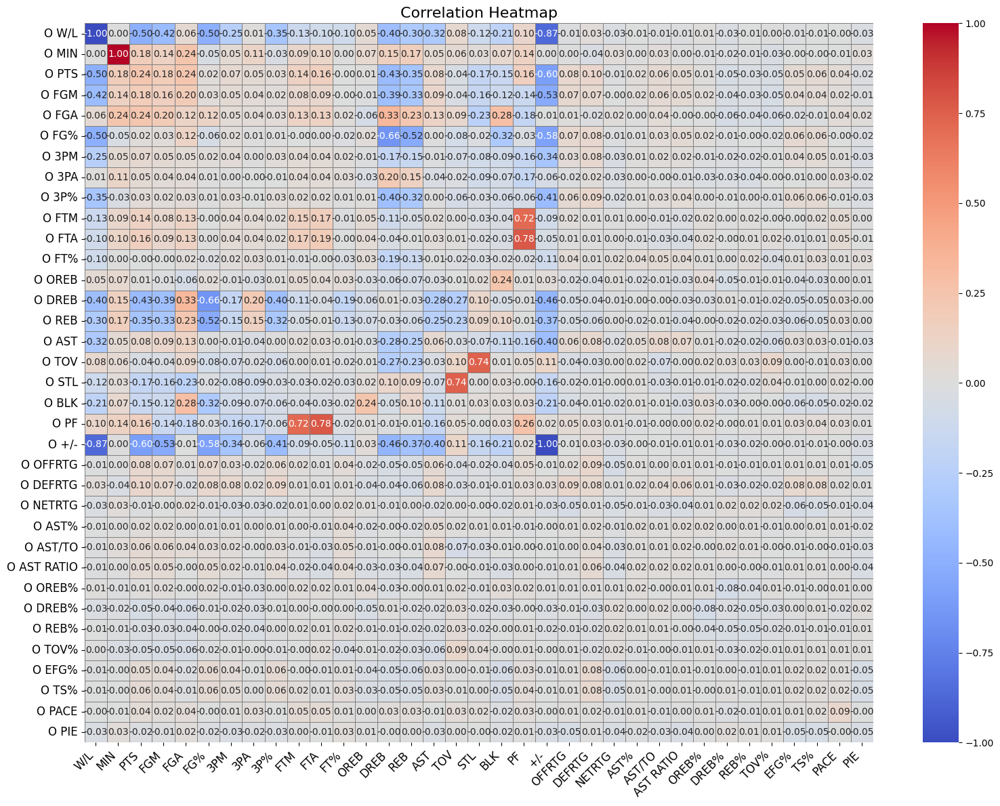

In [29]:
plt.figure(figsize=(16, 12)) 
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f", cbar=True,
            annot_kws={"size": 10},
            linewidths=0.5, linecolor="gray") 
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(rotation=0, fontsize=12) 

plt.title("Correlation Heatmap", fontsize=16)
plt.tight_layout()  
plt.show()


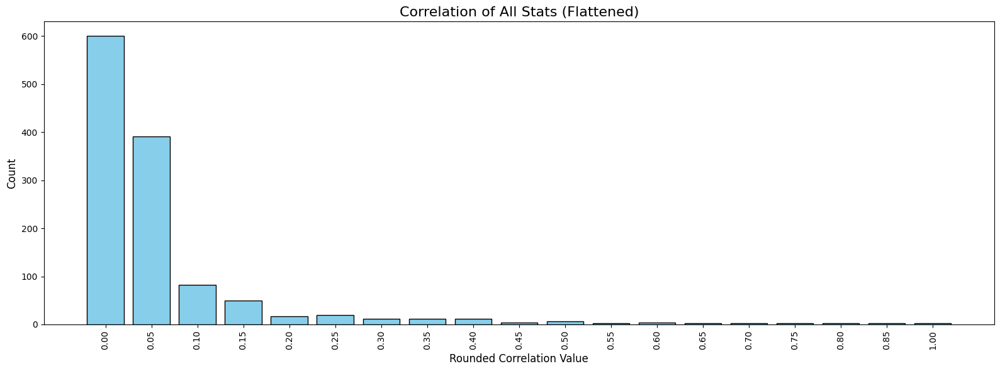

0.00    600
0.05    391
0.10     82
0.15     50
0.20     17
0.25     20
0.30     12
0.35     12
0.40     12
0.45      4
0.50      6
0.55      2
0.60      4
0.65      2
0.70      2
0.75      2
0.80      2
0.85      2
1.00      3
Name: count, dtype: int64


In [30]:
new_correlation = (correlation.abs() / 0.05).round() * 0.05

corr_counts = new_correlation.stack().value_counts().sort_index()

plt.figure(figsize=(16, 6))
plt.bar(corr_counts.index.astype(str), corr_counts.values, color='skyblue', edgecolor='black')


plt.title("Correlation of All Stats (Flattened)", fontsize=16)
plt.xlabel("Rounded Correlation Value", fontsize=12)
plt.ylabel("Count", fontsize=12)

tick_positions = np.arange(0, len(corr_counts), max(1, len(corr_counts) // 10)) 
tick_labels = [f"{tick:.2f}" for tick in corr_counts.index[tick_positions]]

plt.xticks(tick_positions, tick_labels, rotation=90, ha='center', fontsize=10)

plt.tight_layout()

plt.show()
print(corr_counts)

In [31]:
values = corr_counts.index.values
counts = corr_counts.values

weighted_avg = (values * counts).sum() / counts.sum()

print(f"Weighted Average: {weighted_avg:.2f}")

Weighted Average: 0.06


In [32]:
for col in new_correlation.columns:
    relevant_rows = new_correlation[new_correlation[col] > 0.3].index
    if len(relevant_rows) > 0: 
        print(f"{col}: {', '.join(map(str, relevant_rows))}")

W/L: O W/L, O PTS, O FGM, O FG%, O 3P%, O DREB, O REB, O AST, O +/-
MIN: O MIN
PTS: O W/L, O DREB, O REB, O +/-
FGM: O W/L, O DREB, O REB, O +/-
FGA: O DREB, O BLK
FG%: O W/L, O DREB, O REB, O BLK, O +/-
3PM: O +/-
3P%: O W/L, O DREB, O REB, O +/-
FTM: O PF
FTA: O PF
DREB: O W/L, O PTS, O FGM, O FGA, O FG%, O 3P%, O AST, O +/-
REB: O W/L, O PTS, O FGM, O FG%, O 3P%, O +/-
AST: O W/L, O DREB, O +/-
TOV: O STL
STL: O TOV
BLK: O FGA, O FG%
PF: O FTM, O FTA
+/-: O W/L, O PTS, O FGM, O FG%, O 3PM, O 3P%, O DREB, O REB, O AST, O +/-


Relevant Opposing Stats: MIN, W/L, DREB, REB, BLK, +/-, PTS, STL, PF, FG%, FGA, 3P%, TOV,

PLAYER PREPROCCESSING

In [99]:
for list in extracted_text_list:
    print (len(list))

print (extracted_text_list[0][0])

528
528
528
528
528
PLAYER TEAM MATCH UP GAME DATE W/L MIN PTS FGM FGA FG% 3PM 3PA 3P% FTM FTA FT% OREB DREB REB AST STL BLK TOV PF +/-
Brandin Podziemski GSW GSW vs. UTA 04/14/2024 W 21 7 3 7 42.9 1 3 33.3 0 0 0.0 3 6 9 2 2 0 0 0 12
Jabari Smith Jr. HOU HOU @ LAC 04/14/2024 W 33 15 6 19 31.6 2 10 20.0 1 2 50.0 2 6 8 3 0 0 0 1 8
Karl-Anthony Towns MIN MIN vs. PHX 04/14/2024 L 29 10 3 8 37.5 1 4 25.0 3 4 75.0 2 4 6 2 0 0 5 4 -18
Luka Samanic UTA UTA @ GSW 04/14/2024 L 29 14 5 11 45.5 0 5 0.0 4 4 100 1 4 5 2 1 0 7 4 -9
OG Anunoby NYK NYK vs. CHI 04/14/2024 W 43 11 4 10 40.0 2 4 50.0 1 3 33.3 2 3 5 4 2 1 6 4 8
Noah Clowney BKN BKN @ PHI 04/14/2024 L 41 16 5 10 50.0 2 4 50.0 4 5 80.0 1 3 4 2 1 1 1 3 -21
Gui Santos GSW GSW vs. UTA 04/14/2024 W 24 13 5 10 50.0 1 5 20.0 2 2 100 2 3 5 2 1 0 0 3 18
Neemias Queta BOS BOS vs. WAS 04/14/2024 W 20 19 8 11 72.7 0 0 0.0 3 4 75.0 3 6 9 1 0 6 3 2 -4
Jordan Nwora TOR TOR @ MIA 04/14/2024 L 21 14 6 10 60.0 2 4 50.0 0 0 0.0 2 9 11 1 0 0 2 1 -4
Lonnie Walk

In [114]:
def process_element(element, removals):
    combined_text = element[0].splitlines()
    for text in element[1:]:
        lines = text.splitlines()
        for _ in range(removals):
            lines.pop(0)
        combined_text.extend(lines)
    print (len(combined_text))
    return ('\n'.join(combined_text))

In [ ]:
new_text_list = copy.deepcopy(extracted_text_list)
removal_arr = [[0, 1], [1, 1], [2, 5], [3, 1], [4, 16]]
for index, removals in removal_arr:
    new_text_list[index] = process_element(new_text_list[index], removals)


26401
26401
26405
26401
26416
PLAYER TEAM MATCH UP GAME DATE W/L MIN PTS FGM FGA FG% 3PM 3PA 3P% FTM FTA FT% OREB DREB REB AST STL BLK TOV PF +/-
Brandin Podziemski GSW GSW vs. UTA 04/14/2024 W 21 7 3 7 42.9 1 3 33.3 0 0 0.0 3 6 9 2 2 0 0 0 12
Jabari Smith Jr. HOU HOU @ LAC 04/14/2024 W 33 15 6 19 31.6 2 10 20.0 1 2 50.0 2 6 8 3 0 0 0 1 8
Karl-Anthony Towns MIN MIN vs. PHX 04/14/2024 L 29 10 3 8 37.5 1 4 25.0 3 4 75.0 2 4 6 2 0 0 5 4 -18
Luka Samanic UTA UTA @ GSW 04/14/2024 L 29 14 5 11 45.5 0 5 0.0 4 4 100 1 4 5 2 1 0 7 4 -9
OG Anunoby NYK NYK vs. CHI 04/14/2024 W 43 11 4 10 40.0 2 4 50.0 1 3 33.3 2 3 5 4 2 1 6 4 8
Noah Clowney BKN BKN @ PHI 04/14/2024 L 41 16 5 10 50.0 2 4 50.0 4 5 80.0 1 3 4 2 1 1 1 3 -21
Gui Santos GSW GSW vs. UTA 04/14/2024 W 24 13 5 10 50.0 1 5 20.0 2 2 100 2 3 5 2 1 0 0 3 18
Neemias Queta BOS BOS vs. WAS 04/14/2024 W 20 19 8 11 72.7 0 0 0.0 3 4 75.0 3 6 9 1 0 6 3 2 -4
Jordan Nwora TOR TOR @ MIA 04/14/2024 L 21 14 6 10 60.0 2 4 50.0 0 0 0.0 2 9 11 1 0 0 2 1 -4
L

In [182]:
all_player_data = pd.DataFrame()
data_rows = []

text_file = new_text_list[0]
lines = text_file.splitlines()

column_names = lines[0].split()
column_names[2] = column_names[2] + column_names.pop(3)
column_names[3] = column_names[3] + " " + column_names.pop(4)

for line in lines[1:]:
    data_sample = line.split()
    while (len(data_sample) != 27):
        data_sample[0] = data_sample[0] + " " + data_sample.pop(1)
    data_sample.pop(2)
    data_sample.pop(2)
    data_rows.append(data_sample)
    
player_data = pd.DataFrame(data_rows, columns=column_names)
all_player_data = pd.concat([all_player_data, player_data], axis=1)

data_rows = []

text_file = new_text_list[1]
lines = text_file.splitlines()

column_names = lines[0].split()
column_names[13] = column_names[13] + " " + column_names.pop(14)
column_names[17] = column_names[17] + " " + column_names.pop(18)

while (len(column_names) > 15):
    column_names.pop(0)
for line in lines[1:]:
    data_sample = line.split()
    while (len(data_sample) != 24):
        data_sample[0] = data_sample[0] + " " + data_sample.pop(1)
    data_sample.pop(2)
    data_sample.pop(2)

    for _ in range(7):
        data_sample.pop(0)
    data_rows.append(data_sample)
   
player_data = pd.DataFrame(data_rows, columns=column_names)
all_player_data = pd.concat([all_player_data, player_data], axis=1)


data_rows = []

text_file = new_text_list[2]
lines = text_file.splitlines()
for _ in range (4):
    lines[0] = lines[0] + " " + lines.pop(1)

column_names = lines[0].split()
column_names[8] = column_names[8] + " " + column_names.pop(9) + " " + column_names.pop(9)
column_names[9] = column_names[9] + " " + column_names.pop(10)
column_names[12] = column_names[12] + " " + column_names.pop(13) + " " + column_names.pop(13) + " " + column_names.pop(13)
column_names[13] = column_names[13] + " " + column_names.pop(14) + " " + column_names.pop(14)
column_names[14] = column_names[14] + " " + column_names.pop(15)
column_names[15] = column_names[15] + " " + column_names.pop(16)
while (len(column_names) > 12):
    column_names.pop(0)
column_names.pop(8)
column_names.pop(9)

for line in lines[1:]:
    data_sample = line.split()
    while (len(data_sample) != 21):
        data_sample[0] = data_sample[0] + " " + data_sample.pop(1)
    data_sample.pop(2)
    data_sample.pop(2)

    for _ in range(7):
        data_sample.pop(0)
    data_sample.pop(8)
    data_sample.pop(9)
    data_rows.append(data_sample)
player_data = pd.DataFrame(data_rows, columns=column_names)
all_player_data = pd.concat([all_player_data, player_data], axis=1)


data_rows = []

text_file = new_text_list[3]
lines = text_file.splitlines()
column_names = lines[0].split()

while (len(column_names) > 17):
    column_names.pop(0)

for line in lines[1:]:
    data_sample = line.split()
    while (len(data_sample) > 17):
        data_sample.pop(0)
    data_rows.append(data_sample)

player_data = pd.DataFrame(data_rows, columns=column_names)
all_player_data = pd.concat([all_player_data, player_data], axis=1)


data_rows = []

text_file = new_text_list[4]
lines = text_file.splitlines()

for _ in range (15):
    lines[0] = lines[0] + " " + lines.pop(1)
column_names = lines[0].split()
column_names[15] = column_names[15] + " " + column_names.pop(16)
column_names = [column_names[i] + " " + column_names[i + 1] for i in range(8, len(column_names) - 1, 2)]
for line in lines[1:]:
    data_sample = line.split()
    while (len(data_sample) > 15):
        data_sample.pop(0)
    data_rows.append(data_sample)

player_data = pd.DataFrame(data_rows, columns=column_names)
all_player_data = pd.concat([all_player_data, player_data], axis=1)

print(all_player_data.shape)
print(all_player_data)

(26400, 82)
                   PLAYER TEAM MATCHUP   GAME DATE W/L MIN PTS FGM FGA   FG%  \
0      Brandin Podziemski  GSW     UTA  04/14/2024   W  21   7   3   7  42.9   
1        Jabari Smith Jr.  HOU     LAC  04/14/2024   W  33  15   6  19  31.6   
2      Karl-Anthony Towns  MIN     PHX  04/14/2024   L  29  10   3   8  37.5   
3            Luka Samanic  UTA     GSW  04/14/2024   L  29  14   5  11  45.5   
4              OG Anunoby  NYK     CHI  04/14/2024   W  43  11   4  10  40.0   
...                   ...  ...     ...         ...  ..  ..  ..  ..  ..   ...   
26395          Chris Paul  GSW     PHX  10/24/2023   L  34  14   4  15  26.7   
26396      Christian Wood  LAL     DEN  10/24/2023   L  15   7   3   4  75.0   
26397         Eric Gordon  PHX     GSW  10/24/2023   W  32  10   4  16  25.0   
26398         Moses Moody  GSW     PHX  10/24/2023   L  18  11   4   6  66.7   
26399        Kevon Looney  GSW     PHX  10/24/2023   L  28   7   3   6  50.0   

      3PM 3PA   3P% FTM FTA

In [183]:
column_names = all_player_data.columns
ply_srtd = all_player_data
ply_srtd['W/L'] = ply_srtd['W/L'].map({'W': 1, 'L': -1})
numeric_columns = column_names[4:]
ply_srtd[numeric_columns] = ply_srtd[numeric_columns].apply(pd.to_numeric, errors='coerce')
conversion_failed = ply_srtd[numeric_columns].isna().any().any()

if conversion_failed:
    print("Numeric conversion failed for some values.")
else:
    print("All numeric conversions were successful.")

for column in ply_srtd.columns:
    print(f"Column '{column}' has type: {ply_srtd[column].dtype}")



All numeric conversions were successful.
Column 'PLAYER' has type: object
Column 'TEAM' has type: object
Column 'MATCHUP' has type: object
Column 'GAME DATE' has type: object
Column 'W/L' has type: int64
Column 'MIN' has type: int64
Column 'PTS' has type: int64
Column 'FGM' has type: int64
Column 'FGA' has type: int64
Column 'FG%' has type: float64
Column '3PM' has type: int64
Column '3PA' has type: int64
Column '3P%' has type: float64
Column 'FTM' has type: int64
Column 'FTA' has type: int64
Column 'FT%' has type: float64
Column 'OREB' has type: int64
Column 'DREB' has type: int64
Column 'REB' has type: int64
Column 'AST' has type: int64
Column 'STL' has type: int64
Column 'BLK' has type: int64
Column 'TOV' has type: int64
Column 'PF' has type: int64
Column '+/-' has type: int64
Column 'OFFRTG' has type: float64
Column 'DEFRTG' has type: float64
Column 'NETRTG' has type: float64
Column 'AST%' has type: float64
Column 'AST/TO' has type: float64
Column 'AST RATIO' has type: float64
Colu

In [184]:
for col in ply_srtd.columns[4:]:
    data = ply_srtd[col].dropna().values  
    data = data.astype(float)
    
    skewness = skew(data)
    if abs(skewness) >= 1:
        valid_mask = data > 0
        data[valid_mask] = np.log(data[valid_mask] + 1)
        ply_srtd[col] = data


In [186]:
scaler = StandardScaler()
player_stats = ply_srtd.iloc[:,4:]
std_ply_dt = scaler.fit_transform(player_stats)
std_ply = pd.DataFrame(std_ply_dt, columns=player_stats.columns)
ply_scaled = pd.concat([ply_srtd.iloc[:, :4], std_ply], axis=1)
print(ply_scaled)

                   PLAYER TEAM MATCHUP   GAME DATE       W/L       MIN  \
0      Brandin Podziemski  GSW     UTA  04/14/2024  0.996219 -0.134507   
1        Jabari Smith Jr.  HOU     LAC  04/14/2024  0.996219  0.945777   
2      Karl-Anthony Towns  MIN     PHX  04/14/2024 -1.003795  0.585683   
3            Luka Samanic  UTA     GSW  04/14/2024 -1.003795  0.585683   
4              OG Anunoby  NYK     CHI  04/14/2024  0.996219  1.846014   
...                   ...  ...     ...         ...       ...       ...   
26395          Chris Paul  GSW     PHX  10/24/2023 -1.003795  1.035801   
26396      Christian Wood  LAL     DEN  10/24/2023 -1.003795 -0.674649   
26397         Eric Gordon  PHX     GSW  10/24/2023  0.996219  0.855754   
26398         Moses Moody  GSW     PHX  10/24/2023 -1.003795 -0.404578   
26399        Kevon Looney  GSW     PHX  10/24/2023 -1.003795  0.495659   

            PTS       FGM       FGA       FG%       3PM       3PA       3P%  \
0      0.018783  0.062230 -0.207

In [187]:
ply_correlation_matrix = []

for col in std_ply.columns[1:]:
    corr_value = std_ply['PTS'].corr(std_ply[col], method='spearman')
    ply_correlation_matrix.append([corr_value])

ply_correlation = pd.DataFrame(ply_correlation_matrix, index=std_ply.columns[1:], columns=['PTS'])
print(len(ply_correlation_matrix))
print(ply_correlation)


77
                 PTS
MIN         0.803126
PTS         1.000000
FGM         0.975669
FGA         0.902248
FG%         0.528149
...              ...
2FGM %UAST  0.150328
3FGM %AST   0.119217
3FGM %UAST  0.073376
FGM %AST    0.178251
FGM %UAST   0.156200

[77 rows x 1 columns]


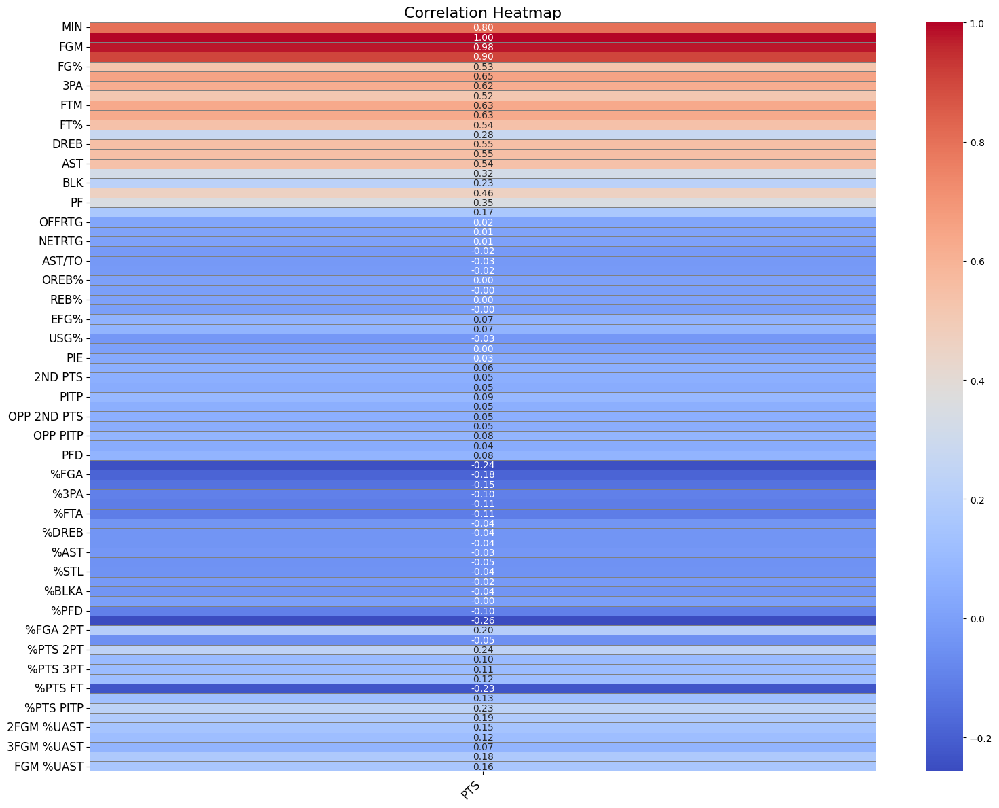

In [188]:
plt.figure(figsize=(16, 12)) 
sns.heatmap(ply_correlation, annot=True, cmap="coolwarm", fmt=".2f", cbar=True,
            annot_kws={"size": 10},
            linewidths=0.5, linecolor="gray") 
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(rotation=0, fontsize=12) 

plt.title("Correlation Heatmap", fontsize=16)
plt.tight_layout()  
plt.show()


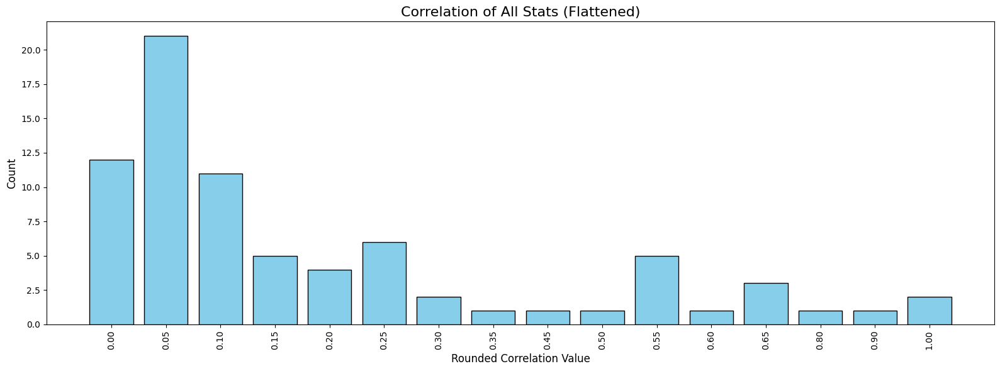

0.00    12
0.05    21
0.10    11
0.15     5
0.20     4
0.25     6
0.30     2
0.35     1
0.45     1
0.50     1
0.55     5
0.60     1
0.65     3
0.80     1
0.90     1
1.00     2
Name: count, dtype: int64


In [189]:
new_ply_correlation = (ply_correlation.abs() / 0.05).round() * 0.05

ply_corr_counts = new_ply_correlation.stack().value_counts().sort_index()

plt.figure(figsize=(16, 6))
plt.bar(ply_corr_counts.index.astype(str), ply_corr_counts.values, color='skyblue', edgecolor='black')


plt.title("Correlation of All Stats (Flattened)", fontsize=16)
plt.xlabel("Rounded Correlation Value", fontsize=12)
plt.ylabel("Count", fontsize=12)

tick_positions = np.arange(0, len(ply_corr_counts), max(1, len(ply_corr_counts) // 10)) 
tick_labels = [f"{tick:.2f}" for tick in ply_corr_counts.index[tick_positions]]

plt.xticks(tick_positions, tick_labels, rotation=90, ha='center', fontsize=10)

plt.tight_layout()

plt.show()
print(ply_corr_counts)

In [190]:
values = ply_corr_counts.index.values
counts = ply_corr_counts.values

weighted_avg = (values * counts).sum() / counts.sum()

print(f"Weighted Average: {weighted_avg:.2f}")

Weighted Average: 0.21


In [191]:
for col in new_ply_correlation.columns:
    relevant_rows = new_ply_correlation[new_ply_correlation[col] > 0.3].index
    if len(relevant_rows) > 0: 
        print(f"{col}: {', '.join(map(str, relevant_rows))}")

PTS: MIN, PTS, FGM, FGA, FG%, 3PM, 3PA, 3P%, FTM, FTA, FT%, OREB, DREB, REB, AST, STL, TOV, PF


Relevant Stats: MIN, PTS, FGM, FGA, FG%, 3PM, 3PA, 3P%, FTM, FTA, FT%, OREB, DREB, REB, AST, STL, TOV, PF

Relevant Opposing Stats: MIN, W/L, DREB, REB, BLK, +/-, PTS, STL, PF, FG%, FGA, 3P%, TOV, FTM, FTA

GENERAL PREPROCESSING

In [192]:
relevant_ply_stats = ['PLAYER', 'TEAM', 'MATCHUP', 'GAME DATE', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'TOV', 'PF']
ply_df = ply_scaled[relevant_ply_stats]

In [48]:
relevant_gm_stats = ['TEAM', 'MATCHUP', 'GAME DATE', 'W/L', 'MIN', 'PTS', 'FGA',
       'FG%', '3P%', 'DREB', 'REB',
       'AST', 'TOV', 'STL', 'BLK', 'PF', '+/-']
gm_df = gm_scaled[relevant_gm_stats]

In [193]:
print(ply_df)

                   PLAYER TEAM MATCHUP   GAME DATE       MIN       PTS  \
0      Brandin Podziemski  GSW     UTA  04/14/2024 -0.134507  0.018783   
1        Jabari Smith Jr.  HOU     LAC  04/14/2024  0.945777  0.702396   
2      Karl-Anthony Towns  MIN     PHX  04/14/2024  0.585683  0.332856   
3            Luka Samanic  UTA     GSW  04/14/2024  0.585683  0.638745   
4              OG Anunoby  NYK     CHI  04/14/2024  1.846014  0.418671   
...                   ...  ...     ...         ...       ...       ...   
26395          Chris Paul  GSW     PHX  10/24/2023  1.035801  0.638745   
26396      Christian Wood  LAL     DEN  10/24/2023 -0.674649  0.018783   
26397         Eric Gordon  PHX     GSW  10/24/2023  0.855754  0.332856   
26398         Moses Moody  GSW     PHX  10/24/2023 -0.404578  0.418671   
26399        Kevon Looney  GSW     PHX  10/24/2023  0.495659  0.018783   

            FGM       FGA       FG%       3PM       3PA       3P%       FTM  \
0      0.062230 -0.207754 -0.026

In [49]:
print(gm_df)

     TEAM MATCHUP   GAME DATE  W/L       MIN       PTS       FGA       FG%  \
0     MIL     ORL  04/14/2024 -1.0 -0.216155 -2.040865 -1.982753 -1.368259   
1     CHI     NYK  04/14/2024 -1.0  3.802665  0.372850  1.725235  0.178009   
2     MIN     PHX  04/14/2024 -1.0 -0.216155 -0.639353 -2.695828  0.705560   
3     CHA     CLE  04/14/2024  1.0 -0.216155  0.450712  0.299086  0.541837   
4     TOR     MIA  04/14/2024 -1.0 -0.216155 -0.872938  0.156471 -0.968048   
...   ...     ...         ...  ...       ...       ...       ...       ...   
2455  TOR     MIN  10/25/2023  1.0 -0.216155 -1.340109  0.156471 -1.368259   
2456  PHX     GSW  10/24/2023  1.0 -0.216155 -0.483629  0.869545 -0.604221   
2457  GSW     PHX  10/24/2023 -1.0 -0.216155 -0.795076  1.725235 -2.168681   
2458  LAL     DEN  10/24/2023 -1.0 -0.216155 -0.561491  0.156471 -0.349541   
2459  DEN     LAL  10/24/2023  1.0 -0.216155  0.372850  0.299086  0.942048   

           3P%      DREB       REB       AST       TOV       ST

In [36]:
print (gm_df.dtypes)

TEAM          object
MATCHUP       object
GAME DATE     object
W/L          float64
MIN          float64
PTS          float64
FGA          float64
FG%          float64
3P%          float64
DREB         float64
REB          float64
AST          float64
TOV          float64
STL          float64
BLK          float64
PF           float64
+/-          float64
dtype: object


In [53]:
gm_df.to_csv('game_data.csv', index=False)

In [194]:
ply_df.to_csv('player_data.csv', index=False)